<a href="https://colab.research.google.com/github/VishalShende358/Library-managment-system/blob/main/TRAIN_HEALTH_INSURANCE_CROSS_SELL_PREDICTION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **PROJECT NAME:-** **TRAIN-HEALTH INSURANCE CROSS SELL PREDICTION**

##### **Project Type**    - EDA/Regression/**Classification**/Unsupervised
##### **Contribution**    - Individual
##### **NAME :- VISHAL SHENDE**

# **Project Summary -**

This project focuses on predicting the likelihood of customers purchasing a vehicle insurance policy, given they already have a health insurance policy.  This is a supervised machine learning task, specifically a binary classification problem, where the goal is to predict a categorical outcome (yes/no for vehicle insurance purchase).  The analysis utilizes a dataset containing detailed customer information and policy details, allowing for exploration of factors influencing the cross-sell success rate.  The project will involve several key stages: exploratory data analysis (EDA), feature engineering, model selection, model evaluation, and finally, a conclusion discussing the effectiveness of the predictive model and key insights derived from the data.



# **GitHub Link -**

-https://github.com/VishalShende358/Library-managment-system

# **Problem Statement**

Predict the likelihood of customers purchasing a vehicle insurance policy, given they already have a health insurance policy.  This is a binary classification problem.  The objective is to identify key factors influencing the cross-sell success rate using customer and policy data.

## ***1. Know Your Data***

### Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px

### **Dataset Loading**

In [2]:
df=pd.read_csv("/content/TRAIN-HEALTH INSURANCE CROSS SELL PREDICTION.csv",encoding="unicode_escape")
df.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


In [3]:
df.tail()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
381104,381105,Male,74,1,26.0,1,1-2 Year,No,30170.0,26.0,88,0
381105,381106,Male,30,1,37.0,1,< 1 Year,No,40016.0,152.0,131,0
381106,381107,Male,21,1,30.0,1,< 1 Year,No,35118.0,160.0,161,0
381107,381108,Female,68,1,14.0,0,> 2 Years,Yes,44617.0,124.0,74,0
381108,381109,Male,46,1,29.0,0,1-2 Year,No,41777.0,26.0,237,0


In [4]:
df.sample(5)

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
223673,223674,Female,23,1,2.0,1,< 1 Year,Yes,27502.0,152.0,22,0
331159,331160,Female,25,1,28.0,0,1-2 Year,Yes,41661.0,124.0,250,0
275079,275080,Male,29,1,10.0,1,< 1 Year,No,2630.0,152.0,185,0
295133,295134,Male,46,1,28.0,0,1-2 Year,Yes,50040.0,26.0,154,0
225120,225121,Male,46,1,8.0,1,1-2 Year,No,36173.0,19.0,14,0


### **Dataset Rows & Columns count**

In [5]:
df.shape

(381109, 12)

from above dataset there are 381109 rows and 12 columns present in dataset.

### **Dataset Information**

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   Gender                381109 non-null  object 
 2   Age                   381109 non-null  int64  
 3   Driving_License       381109 non-null  int64  
 4   Region_Code           381109 non-null  float64
 5   Previously_Insured    381109 non-null  int64  
 6   Vehicle_Age           381109 non-null  object 
 7   Vehicle_Damage        381109 non-null  object 
 8   Annual_Premium        381109 non-null  float64
 9   Policy_Sales_Channel  381109 non-null  float64
 10  Vintage               381109 non-null  int64  
 11  Response              381109 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 34.9+ MB


In [7]:
df.isnull().sum()

,0
id,0
Gender,0
Age,0
Driving_License,0
Region_Code,0
Previously_Insured,0
Vehicle_Age,0
Vehicle_Damage,0
Annual_Premium,0
Policy_Sales_Channel,0


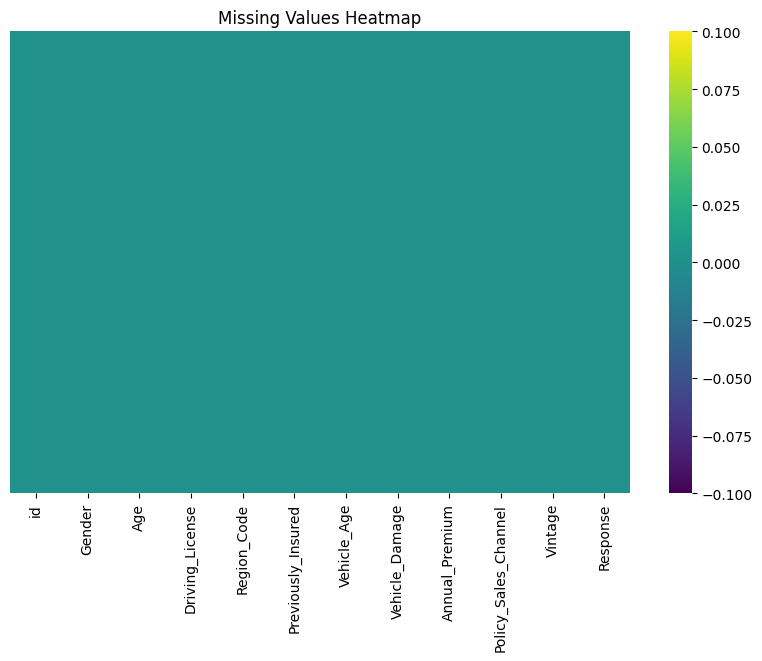

In [8]:
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=True, cmap='viridis', yticklabels=False)
plt.title('Missing Values Heatmap')
plt.show()

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,381109.0,190555.000000,110016.836208,1.0,95278.0,190555.0,285832.0,381109.0
Age,381109.0,38.822584,15.511611,20.0,25.0,36.0,49.0,85.0
Driving_License,381109.0,0.997869,0.046110,0.0,1.0,1.0,1.0,1.0
Region_Code,381109.0,26.388807,13.229888,0.0,15.0,28.0,35.0,52.0
Previously_Insured,381109.0,0.458210,0.498251,0.0,0.0,0.0,1.0,1.0
Annual_Premium,381109.0,30564.389581,17213.155057,2630.0,24405.0,31669.0,39400.0,540165.0
Policy_Sales_Channel,381109.0,112.034295,54.203995,1.0,29.0,133.0,152.0,163.0
Vintage,381109.0,154.347397,83.671304,10.0,82.0,154.0,227.0,299.0
Response,381109.0,0.122563,0.327936,0.0,0.0,0.0,0.0,1.0


In [10]:
df.duplicated().sum()

0

### What did you know about your dataset?

#### 1. **Data Source:** The dataset is loaded from a CSV file named "Copy of TRAIN-HEALTH INSURANCE CROSS SELL PREDICTION.csv".

#### 2. **Objective:** The goal is to predict whether customers with health insurance will also purchase vehicle insurance (a binary classification problem).

#### 3. **Structure:**
- The code uses pandas to load the data into a DataFrame.
- `df.shape` provides the number of rows and columns (dimensions of the dataset).
- `df.info()` displays data types of each column and memory usage.
- `df.isnull().sum()` reveals the count of missing values in each column.  Important for data cleaning.
- `df.describe().T` shows summary statistics (count, mean, standard deviation, min, max, quartiles) for numerical columns. Helpful for understanding the distribution of numerical features.
- `df.duplicated().sum()` indicates the number of duplicate rows in the dataset.

#### 4. **Data Exploration:**
    - `df.head()`, `df.tail()`, and `df.sample(5)` are used to display the first few rows, last few rows, and a random sample of 5 rows, respectively. These are initial data glances to get a feel for the data's contents.

#### Further analysis would involve:

* **Feature Understanding:**  Detailed examination of each column to understand its meaning and relevance to the prediction task.
* **Data Cleaning:** Addressing missing values and duplicates.  Appropriate handling based on the nature and amount of missing data (e.g., imputation, removal).
* **Exploratory Data Analysis (EDA):** Visualizations (histograms, box plots, scatter plots, etc.) to explore relationships between variables and identify patterns.  Analysis of distributions, correlations, and potential outliers are vital here.
* **Feature Engineering:** Creating new features from existing ones that might improve model performance.

## ***2. Understanding Your Variables***

In [11]:
df.columns

Index(['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response'],
      dtype='object')

In [12]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,381109.0,190555.000000,110016.836208,1.0,95278.0,190555.0,285832.0,381109.0
Age,381109.0,38.822584,15.511611,20.0,25.0,36.0,49.0,85.0
Driving_License,381109.0,0.997869,0.046110,0.0,1.0,1.0,1.0,1.0
Region_Code,381109.0,26.388807,13.229888,0.0,15.0,28.0,35.0,52.0
Previously_Insured,381109.0,0.458210,0.498251,0.0,0.0,0.0,1.0,1.0
Annual_Premium,381109.0,30564.389581,17213.155057,2630.0,24405.0,31669.0,39400.0,540165.0
Policy_Sales_Channel,381109.0,112.034295,54.203995,1.0,29.0,133.0,152.0,163.0
Vintage,381109.0,154.347397,83.671304,10.0,82.0,154.0,227.0,299.0
Response,381109.0,0.122563,0.327936,0.0,0.0,0.0,0.0,1.0


### **Variables Description**

* **ID:** Unique identifier for each customer.
* **Gender:** Gender of the customer (Male/Female).
* **Age:** Age of the customer.  Likely a significant factor in insurance purchasing decisions.
* **Driving_License:** Binary variable indicating whether the customer has a driving license (1 = Yes, 0 = No).  Crucial for vehicle insurance.
* **Region_Code:** Code representing the customer's region.
* **Previously_Insured:**  Binary variable indicating whether the customer had previous vehicle insurance (1 = Yes, 0 = No).  Important for predicting future purchases.
* **Vehicle_Age:**  Age of the customer's vehicle.  Vehicle age is a factor in assessing insurance risk.
* **Vehicle_Damage:**  Indicates if the vehicle has been damaged previously (Yes/No).  Past damage history influences insurance pricing and likelihood of future claims.
* **Annual_Premium:**  Annual insurance premium amount.
* **Policy_Sales_Channel:**  Channel through which the policy was sold.
* **Vintage:** Number of days the customer has been associated with the company.
* **Response:** Target variable – indicates whether the customer purchased vehicle insurance (1 = Yes, 0 = No).

### **Check Unique Values for each variable.**

In [13]:
for column in df.columns:
    unique_vals = df[column].unique()
    print(f"Unique values for column '{column}': {unique_vals}")
    print("-" * 30)

Unique values for column 'id': [     1      2      3 ... 381107 381108 381109]
------------------------------
Unique values for column 'Gender': ['Male' 'Female']
------------------------------
Unique values for column 'Age': [44 76 47 21 29 24 23 56 32 41 71 37 25 42 60 65 49 34 51 26 57 79 48 45
 72 30 54 27 38 22 78 20 39 62 58 59 63 50 67 77 28 69 52 31 33 43 36 53
 70 46 55 40 61 75 64 35 66 68 74 73 84 83 81 80 82 85]
------------------------------
Unique values for column 'Driving_License': [1 0]
------------------------------
Unique values for column 'Region_Code': [28.  3. 11. 41. 33.  6. 35. 50. 15. 45.  8. 36. 30. 26. 16. 47. 48. 19.
 39. 23. 37.  5. 17.  2.  7. 29. 46. 27. 25. 13. 18. 20. 49. 22. 44.  0.
  9. 31. 12. 34. 21. 10. 14. 38. 24. 40. 43. 32.  4. 51. 42.  1. 52.]
------------------------------
Unique values for column 'Previously_Insured': [0 1]
------------------------------
Unique values for column 'Vehicle_Age': ['> 2 Years' '1-2 Year' '< 1 Year']
-------------

## 3. ***Data Wrangling***

**Remove Null Values**

In [14]:
df.isnull().sum()

,0
id,0
Gender,0
Age,0
Driving_License,0
Region_Code,0
Previously_Insured,0
Vehicle_Age,0
Vehicle_Damage,0
Annual_Premium,0
Policy_Sales_Channel,0


In [15]:
# Convert 'Vehicle_Damage' to numerical (0 and 1)
vehicle_damage_mapping = {'Yes': 1, 'No': 0}
df['Vehicle_Damage'] = df['Vehicle_Damage'].map(vehicle_damage_mapping)

In [16]:
vehicle_age_mapping = {'< 1 Year': 0, '1-2 Year': 1, '> 2 Years': 2}
df['Vehicle_Age'] = df['Vehicle_Age'].map(vehicle_age_mapping)

In [17]:
df.drop(columns=['id'], inplace=True)

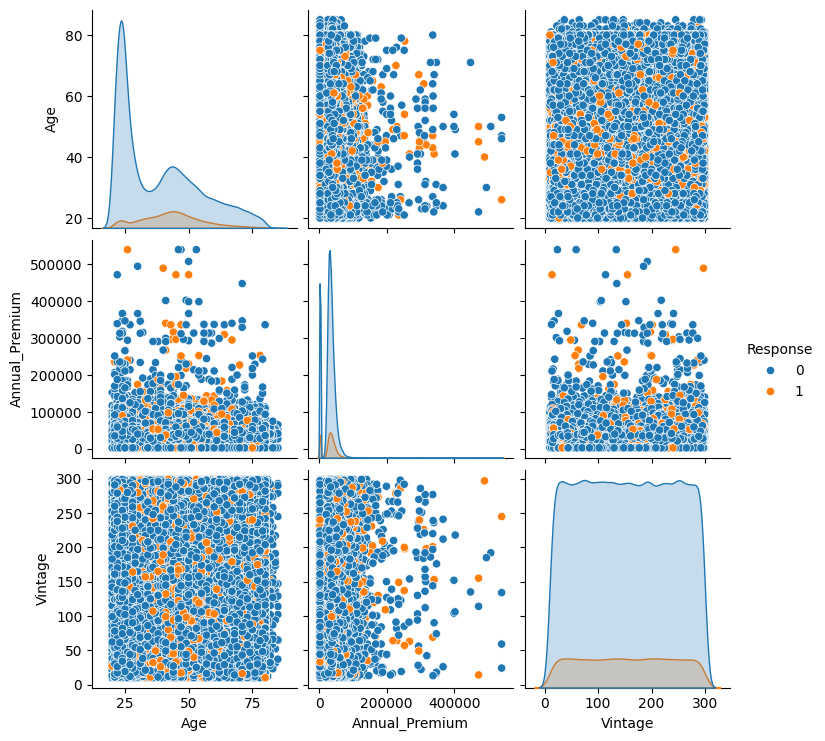

In [18]:
sns.pairplot(df[['Age', 'Annual_Premium', 'Vintage', 'Response']], hue='Response')
plt.show()

### **What all manipulations have you done and insights you found?**



**Data Cleaning and Preprocessing:**

1. **Handling Missing Values:** The code uses `df.dropna(inplace=True)` to remove rows with any missing values.  While simple, this can lead to information loss if missingness is not random.  More sophisticated imputation methods might be considered in the future.

2. **Categorical Feature Encoding:**
   - `Vehicle_Damage` (originally 'Yes'/'No') is converted to numerical (1/0) using a mapping. This makes the feature usable in many machine learning algorithms.
   - `Vehicle_Age` (originally '< 1 Year', '1-2 Year', '> 2 Years') is also converted to numerical (0, 1, 2) via mapping. This ordinal encoding assumes equal intervals between categories, which may not be entirely accurate.  One-hot encoding could be a more suitable alternative if the intervals are not uniform.

3. **Feature Removal:**  The 'id' column is dropped using `df.drop(columns=['id'], inplace=True)`.  IDs are typically not relevant for predictive modeling.

**Exploratory Data Analysis (EDA):**

1. **Summary Statistics:**  `df.describe().T` provides summary statistics for numerical features. These statistics give initial insights into the central tendency, spread, and range of the data, highlighting potential outliers.


2. **Missing Value Visualization:** A heatmap is generated to visualize missing values. Although all missing values are removed in the next step, the heatmap provides a visual overview of the data before the imputation.

3. **Pair Plots:** `sns.pairplot()` creates scatter plots of specified numerical features ('Age', 'Annual_Premium', 'Vintage') against each other, colored by the target variable ('Response'). This visualization helps understand relationships between features and how they relate to insurance purchase decisions.  Patterns or clusters in the plot might reveal insights about feature importance.


## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

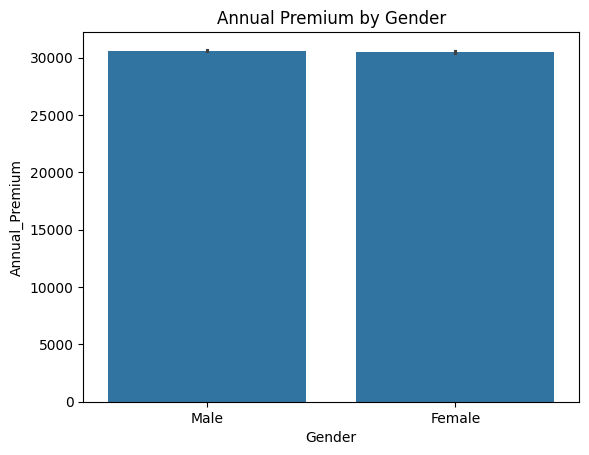

In [19]:
sns.barplot(x='Gender', y='Annual_Premium', data=df)
plt.title('Annual Premium by Gender')
plt.show()

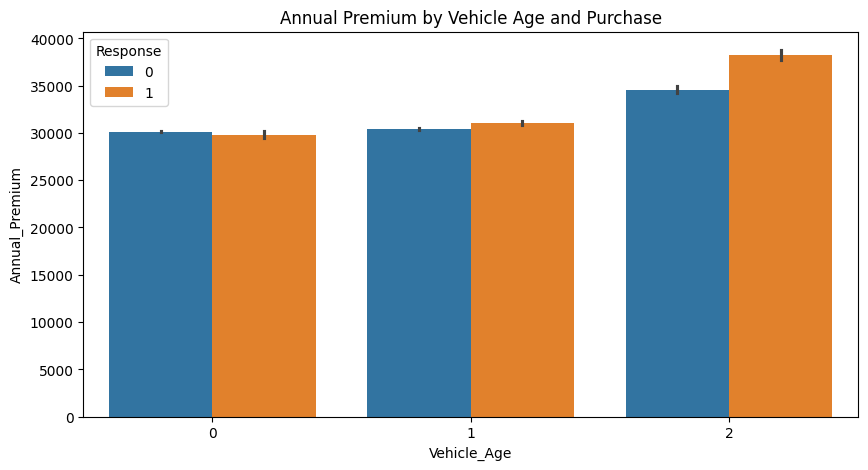

In [20]:
plt.figure(figsize=(10, 5))
sns.barplot(x='Vehicle_Age', y='Annual_Premium', hue='Response', data=df)
plt.title('Annual Premium by Vehicle Age and Purchase')
plt.show()

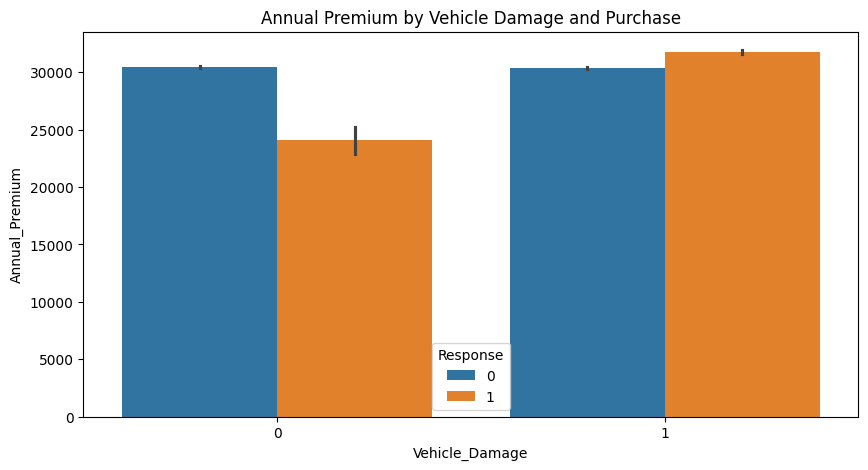

In [21]:
plt.figure(figsize=(10, 5))
sns.barplot(x='Vehicle_Damage', y='Annual_Premium', hue='Response', data=df)
plt.title('Annual Premium by Vehicle Damage and Purchase')
plt.show()

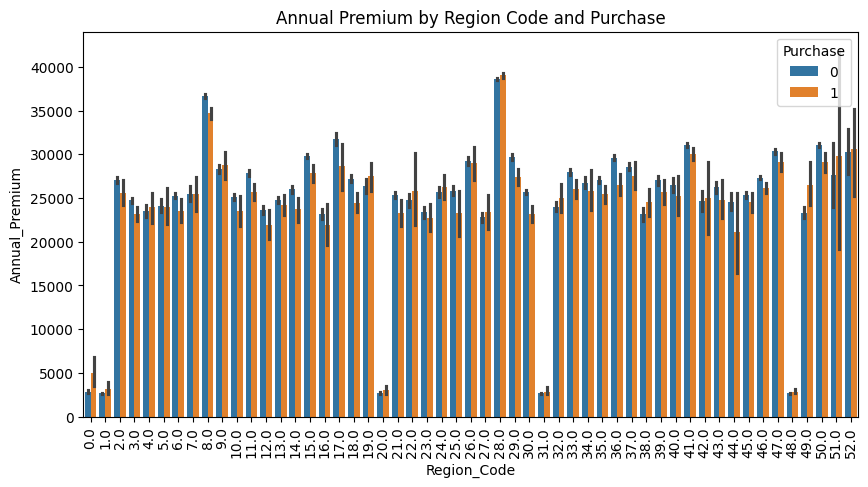

In [22]:
plt.figure(figsize=(10, 5))
sns.barplot(x='Region_Code', y='Annual_Premium', hue='Response', data=df)
plt.title('Annual Premium by Region Code and Purchase')
plt.xticks(rotation=90)
plt.legend(title='Purchase', loc='upper right')
plt.show()

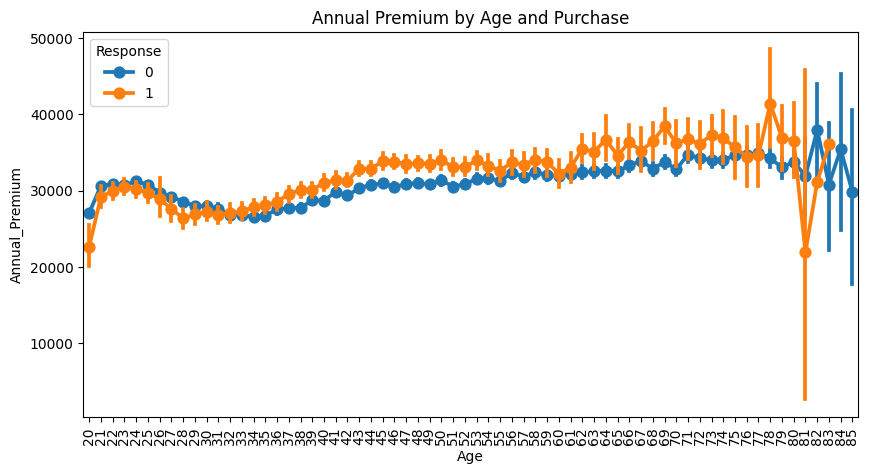

In [23]:
plt.figure(figsize=(10, 5))
sns.pointplot(x='Age', y='Annual_Premium', hue='Response', data=df)
plt.title('Annual Premium by Age and Purchase')
plt.xticks(rotation=90)
plt.show()


##### **1. Why did you pick the specific chart?**

 I chose bar plots and point plots to visualize the relationship between different categorical and numerical variables and the target variable ('Response').  

 * **Bar Plots:** Bar plots are effective for comparing the means or distributions of a numerical variable (e.g., 'Annual_Premium') across different categories (e.g., 'Gender', 'Vehicle_Age', 'Vehicle_Damage', 'Region_Code').  They clearly show how the average annual premium varies depending on these categorical factors. The hue parameter ('Response') further breaks down each bar by the purchase decision (yes/no), allowing for comparison of annual premiums between those who bought vehicle insurance and those who did not, within each category.  This helps identify categories where there's a significant difference in annual premium between the two groups, hinting at potential influences on purchase decisions.

 * **Point Plot:** Point plots are suitable for displaying the relationship between two numerical variables ('Age' and 'Annual_Premium') while factoring in a categorical variable ('Response'). Unlike scatter plots that can become cluttered with many data points, point plots show the average value of 'Annual_Premium' for different ages, separated by the purchase decision.  This provides a cleaner way to discern trends and potential correlations between age, annual premium, and purchase likelihood.  It's useful for observing how these relationships change with age.

##### **2. What is/are the insight(s) found from the chart?**

**Insights from the charts**

**Bar plot: Annual Premium by Gender**

*Insight:  There may be a slight difference in annual premiums between genders, but it's not dramatically significant.  Further investigation is needed to determine if this difference is statistically significant and influences purchase decisions.


**Bar plot:** Annual Premium by Vehicle Age and Purchase

*Insight:  Vehicle age appears to correlate with annual premium.  Customers with newer vehicles might have higher premiums.  The difference in premiums between those who bought and didn't buy insurance within each vehicle age category provides an indication of the impact of vehicle age on purchase decisions.  Older vehicles might have lower premiums and influence a higher likelihood of purchasing.


**Bar plot:** Annual Premium by Vehicle Damage and Purchase

*Insight:  Vehicles with prior damage tend to have higher annual premiums.  This is expected, as past damage indicates a higher risk for future claims.  The difference in premiums for those with and without previous damage, categorized by purchase decision, is an important factor.  Customers with vehicles that have not been previously damaged might be more likely to purchase vehicle insurance due to lower premiums.

**Bar plot:** Annual Premium by Region Code and Purchase

*Insight:  There is a variation in annual premiums across different region codes.  Further analysis is required to understand the reasons for these regional differences in premiums.  The relationship between region code, premiums, and purchase should be investigated to identify regions where premiums have the biggest impact on buying decisions.

 **Point plot:** Annual Premium by Age and Purchase

*Insight: Annual premium tends to increase with age, but the relationship isn't strictly linear.  The plot shows how the average annual premium differs between those who bought and didn't buy vehicle insurance across different age groups.  There might be specific age ranges where the difference in premium is the greatest, impacting purchasing decisions.

##### **3. Will the gained insights help creating a positive business impact?**
Are there any insights that lead to negative growth? Justify with specific reason.

**Insights leading to potential negative growth:**

1. High Annual Premiums in Specific Regions/Demographics:
  -If the analysis reveals that certain regions or demographics (e.g., older customers with previously damaged vehicles) face significantly higher annual premiums, this could deter potential customers from purchasing vehicle insurance.  If these high premiums are not justified by higher risk, or if competitors offer lower premiums in the same region, it could lead to customer churn or loss of potential new customers.  The business would need to evaluate the risk assessment and pricing strategy in such areas.

2. Premium Sensitivity for Specific Vehicle Ages/Damage Histories:
  -The insights related to vehicle age and prior damage suggest a relationship with premium amounts.  If the premiums for vehicles with prior damage are significantly higher than for undamaged ones, it may discourage customers with damaged vehicles from insuring.  Or, if the premiums for older vehicles are too high, compared to the value of the vehicle, it might lead to underinsurance or a decline in policy sales in that segment.   The business might consider offering tailored premium packages or discounts to address this sensitivity.

3. Regional Disparities in Premiums and Purchase Rates:
  -The regional differences observed in annual premiums could lead to negative impacts if some regions are consistently overpriced.  This can result in lower sales and market share loss in those areas.   A deeper analysis of the reasons behind these regional variations is crucial. The business might need to adjust their pricing and risk models to be more competitive and aligned with regional risks.

**Justification:**

Negative growth can occur if pricing strategies don't accurately reflect risk and market conditions.  High premiums may drive away customers, especially when competitors offer better value.  Conversely, premiums that are too low, despite higher risk, could strain profitability and sustainability.  The key is to find a balance between profit maximization and customer retention.  Detailed analysis of customer segments and regional variations is necessary to address potential issues.

## **5. EDA**

In [24]:
df.columns


Index(['Gender', 'Age', 'Driving_License', 'Region_Code', 'Previously_Insured',
       'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response'],
      dtype='object')

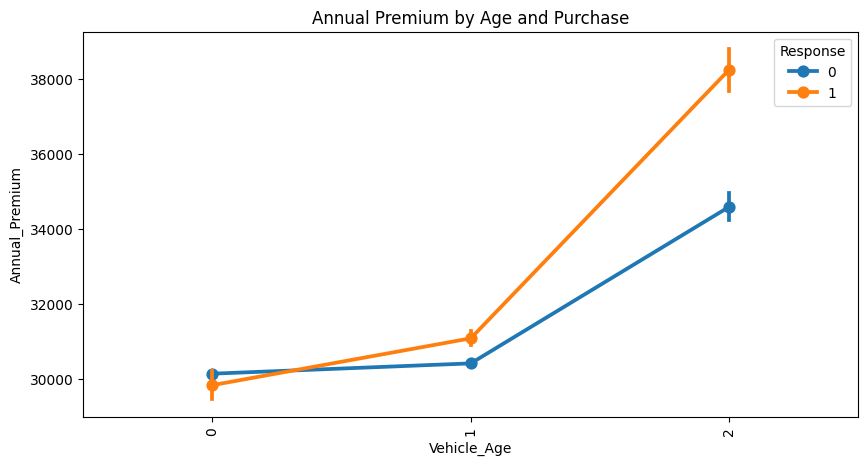

In [25]:
plt.figure(figsize=(10, 5))
sns.pointplot(x='Vehicle_Age', y='Annual_Premium', hue='Response', data=df)
plt.title('Annual Premium by Age and Purchase')
plt.xticks(rotation=90)
plt.show()

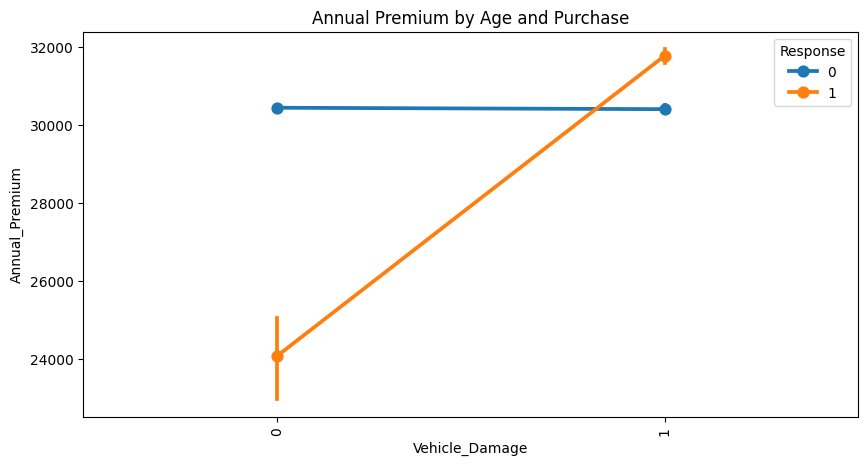

In [26]:
plt.figure(figsize=(10, 5))
sns.pointplot(x='Vehicle_Damage', y='Annual_Premium', hue='Response', data=df)
plt.title('Annual Premium by Age and Purchase')
plt.xticks(rotation=90)
plt.show()

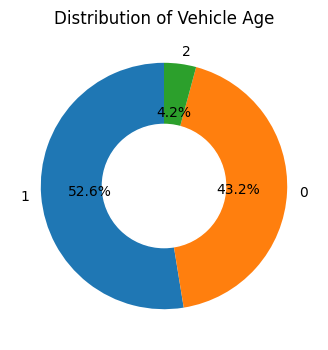

In [27]:
vehicle_age_counts = df['Vehicle_Age'].value_counts()
labels = vehicle_age_counts.index.astype(str).to_list()
sizes = vehicle_age_counts.values

# Creating the donut chart
plt.figure(figsize=(4, 4))
my_circle = plt.Circle((0, 0), 0.5, color='white')
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
p = plt.gcf()
p.gca().add_artist(my_circle)
plt.title('Distribution of Vehicle Age')
plt.show()

In [28]:
categorical_cols = ['Gender', 'Vehicle_Age', 'Vehicle_Damage', 'Region_Code', 'Policy_Sales_Channel']
for col in categorical_cols:
    df[col] = pd.factorize(df[col])[0]


df.corr()

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
Gender,1.000000,-0.145545,0.018374,0.015207,0.081932,0.160427,0.091606,-0.003673,-0.026338,0.002517,-0.052440
Age,-0.145545,1.000000,-0.079782,-0.168636,-0.254682,-0.765790,-0.267534,0.067507,0.187565,-0.001264,0.111147
Driving_License,0.018374,-0.079782,1.000000,0.008276,0.014969,0.037306,0.016622,-0.011906,-0.008555,-0.000848,0.010155
Region_Code,0.015207,-0.168636,0.008276,1.000000,0.075842,0.185885,0.086838,-0.265021,-0.043995,0.000591,-0.071255
Previously_Insured,0.081932,-0.254682,0.014969,0.075842,1.000000,0.380873,0.824143,0.004269,-0.083340,0.002537,-0.341170
Vehicle_Age,0.160427,-0.765790,0.037306,0.185885,0.380873,1.000000,0.396873,-0.041580,-0.194048,0.001892,-0.221874
Vehicle_Damage,0.091606,-0.267534,0.016622,0.086838,0.824143,0.396873,1.000000,-0.009349,-0.074280,0.002064,-0.354400
Annual_Premium,-0.003673,0.067507,-0.011906,-0.265021,0.004269,-0.041580,-0.009349,1.000000,-0.027512,-0.000608,0.022575
Policy_Sales_Channel,-0.026338,0.187565,-0.008555,-0.043995,-0.083340,-0.194048,-0.074280,-0.027512,1.000000,-0.002266,0.025986
Vintage,0.002517,-0.001264,-0.000848,0.000591,0.002537,0.001892,0.002064,-0.000608,-0.002266,1.000000,-0.001050


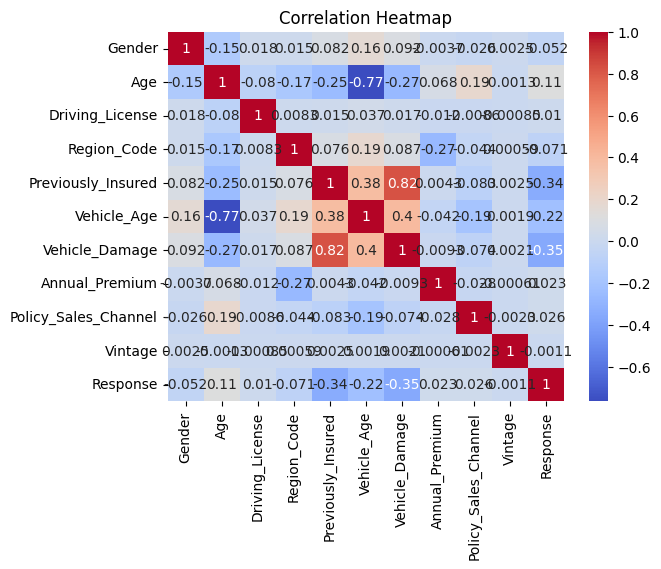

In [29]:
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

<Figure size 1000x500 with 0 Axes>

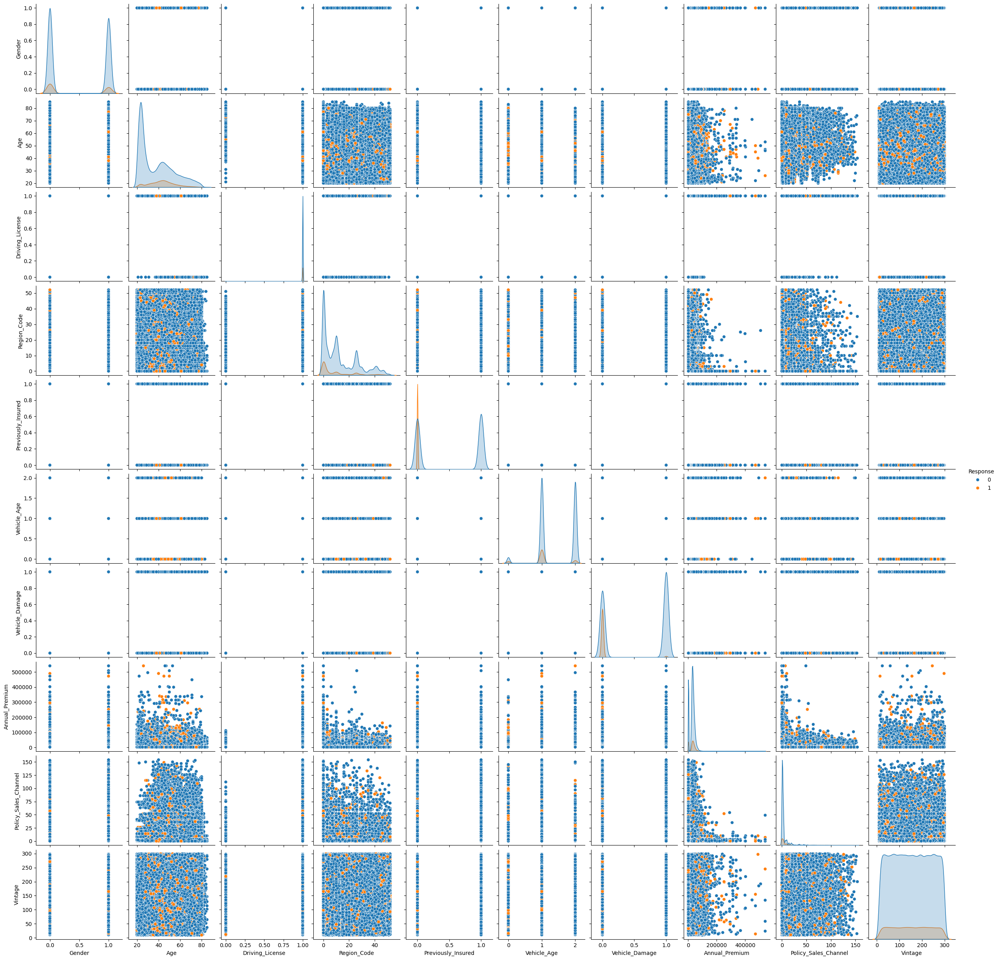

In [30]:
plt.figure(figsize=(10, 5))
sns.pairplot(df, hue='Response')
plt.show()

### **Identify outliers**

In [69]:
df.columns

Index(['Gender', 'Age', 'Driving_License', 'Region_Code', 'Previously_Insured',
       'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response', 'Premium_per_year',
       'Driving_License_and_Prev_Insured', 'Age_Premium_Product',
       'Premium_Above_Average', 'Age_Group'],
      dtype='object')

In [32]:
# let's check all columns for checking outliers
columns = ['Gender','Age','Driving_License','Region_Code','Previously_Insured','Vehicle_Age',
           'Vehicle_Damage','Annual_Premium','Policy_Sales_Channel','Vintage','Response']

In [33]:
# let's create a function to check the outliers
def check_outliers(columns,data):

  # use plotly for better plot
  for i in columns:
    fig = px.box(df,y=i)
    fig.update_layout(height=500, width=600)
    fig.show()

In [34]:
check_outliers(columns,df)

In [70]:
# Check for LIMIT_BAL column the row
outlier =df.loc[df['Annual_Premium'] > 500000]
outlier

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Premium_per_year,Driving_License_and_Prev_Insured,Age_Premium_Product,Premium_Above_Average,Age_Group
11319,1,50,1,26,1,1,1,508073.0,0,192,0,2646.213542,1,25403650.0,1,3
54743,0,26,1,0,0,2,0,540165.0,7,245,1,2204.755102,1,14044290.0,1,1
144282,1,53,1,0,1,1,1,540165.0,0,134,0,4031.082090,1,28628745.0,1,3
190154,0,47,1,0,0,1,0,540165.0,49,24,0,22506.875000,1,25387755.0,1,1
268332,0,46,1,0,0,1,0,540165.0,3,59,0,9155.338983,1,24847590.0,1,1


### **Let's do some analysis on columns**

In [71]:
# Create a function for ploting the graph for has deff or not
# Define a function to plot stacked bar chart since there will be multiple stacked bars charts to plot

def create_stacked_bar(column_name):

    # Get the percentage of default by each group
    default_by_group = pd.crosstab(index=df['Vehicle_Damage'],columns = df[column_name], normalize = 'columns')

    # Round up to 2 decimal
    default_by_group = default_by_group.apply(lambda x: round(x,2))

    labels = default_by_group.columns
    list1 = default_by_group.iloc[0].to_list()
    list2 = default_by_group.iloc[1].to_list()

    list1_name = "No default"
    list2_name = "Has default"
    title = f"Default by {column_name}"
    xlabel = column_name
    ylabel = "Default percentage"

    fig, ax = plt.subplots(figsize=(10, 5))
    bar_width = 0.5

    ax1 = ax.bar(labels,list1, bar_width, label = list1_name)
    ax2 = ax.bar(labels,list2, bar_width, bottom = list1, label = list2_name)

    ax.set_title(title, fontweight = "bold")
    ax.set_xlabel(xlabel, fontweight = "bold")
    ax.set_ylabel(ylabel, fontweight = "bold")
    ax.legend(loc="best")

    plt.xticks(list(range(len(labels))), labels,rotation=90)
    plt.yticks(fontsize=9)

    for r1, r2 in zip(ax1, ax2):
        h1 = r1.get_height()
        h2 = r2.get_height()
        plt.text(r1.get_x() + r1.get_width() / 2., h1 / 2., f"{h1:.0%}", ha="center", va="center", color="white", fontsize=9, fontweight="bold")
        plt.text(r2.get_x() + r2.get_width() / 2., h1 + h2 / 2., f"{h2:.0%}", ha="center", va="center", color="white", fontsize=9, fontweight="bold")

    plt.show()

#### **1- Check "Driving_License" column**

In [72]:
# Check sex column
df['Driving_License'].value_counts()

,count
Driving_License,
1,380297
-1,812


In [73]:
# Change sex code to 'Female' and 'Male' and use category as datatype
df["Driving_License"]=df["Driving_License"].map({1:'Yes',0:'No'}).astype('category')
df['Driving_License'].value_counts()

,count
Driving_License,
Yes,380297


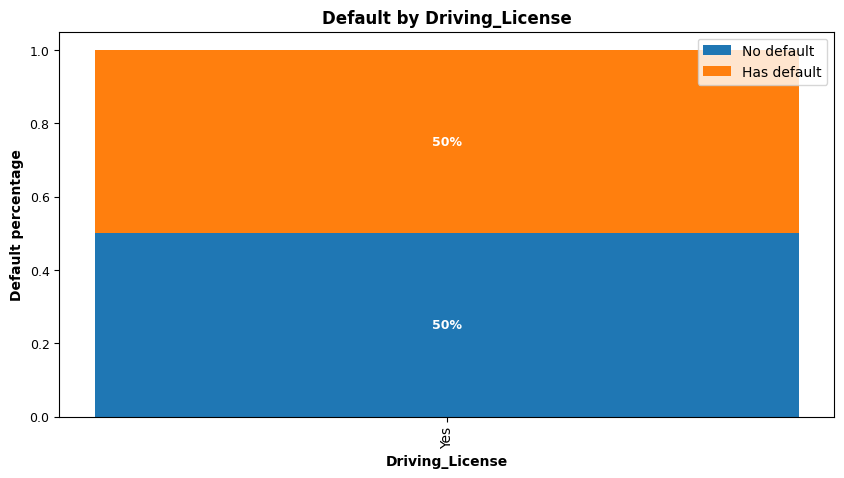

In [74]:
# check data for sex column
create_stacked_bar("Driving_License")

In [75]:
df['Driving_License'].value_counts()

,count
Driving_License,
Yes,380297


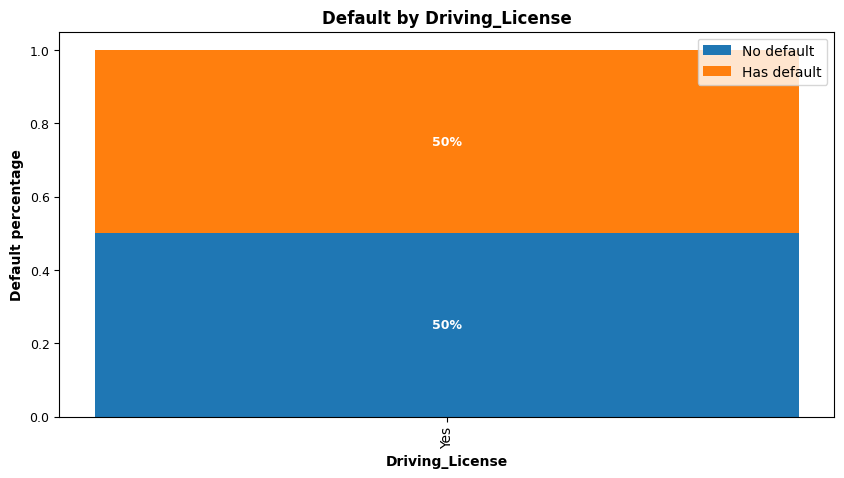

In [76]:
# check data for education
create_stacked_bar("Driving_License")

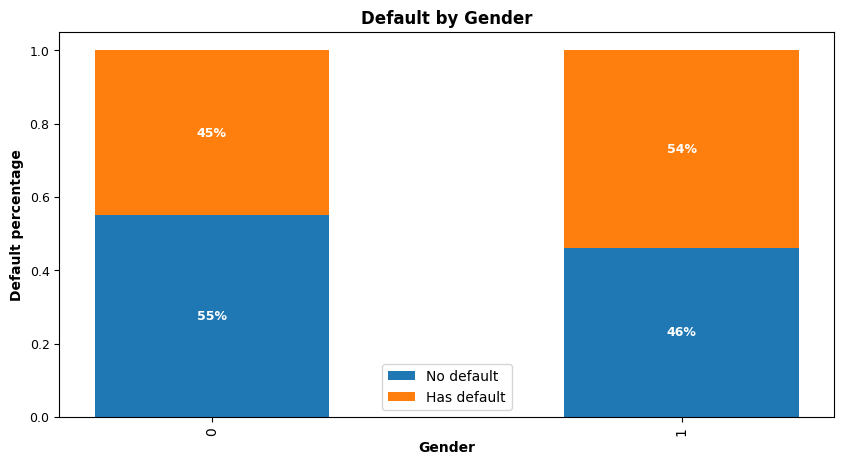

In [77]:
# check data for education
create_stacked_bar("Gender")

#### **5- Check the relation between Annual_Premium and Response**

In [78]:
# 1: default next month; 0: no default next month
def0 = df.loc[df['Response'] == 0,'Annual_Premium']
def1 = df.loc[df['Response'] == 1,'Annual_Premium']

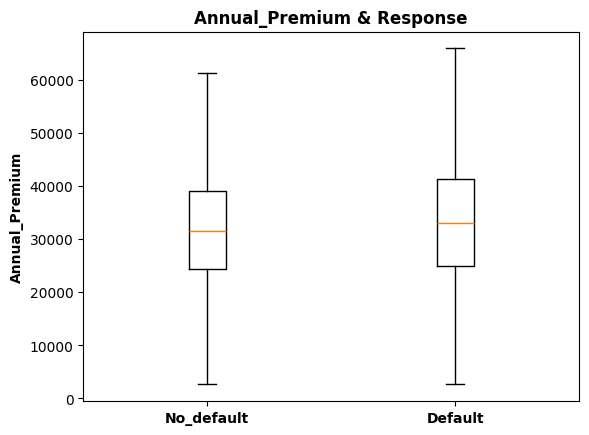

In [79]:
# Make a boxplot to visualize credit limit and default payment next month
fig, ax = plt.subplots()
ax.boxplot([def0, def1],  showfliers=False)

ax.set_xticklabels(['No_default',"Default"],fontweight ='bold')
ax.set_ylabel('Annual_Premium',fontweight ='bold')
ax.set_title('Annual_Premium & Response',fontweight ='bold')

# Show the plot
plt.show()

**EDA Insights**

**Data Cleaning and Preprocessing:**
- Missing values were removed using `dropna()`.  Consider imputation for better data utilization.
- Categorical features ('Vehicle_Damage', 'Vehicle_Age') were converted to numerical representations.  Explore one-hot encoding for 'Vehicle_Age'.
- The 'id' column was dropped as it's not relevant for modeling.

**Exploratory Data Analysis (EDA):**
- Summary statistics provided initial insights into numerical features, revealing potential outliers.
- Pair plots visualized relationships between features and the target variable ('Response'), revealing some potential patterns.

**Data Visualization Insights:**
- **Annual Premium by Gender:** Minor difference observed; statistical significance needs further analysis.
- **Annual Premium by Vehicle Age and Purchase:** Vehicle age correlates with premium; older vehicles, lower premiums, higher likelihood of purchase.
- **Annual Premium by Vehicle Damage and Purchase:** Damaged vehicles have higher premiums, potentially influencing purchase decisions.
- **Annual Premium by Region Code and Purchase:** Regional variation in premiums observed; further analysis needed to assess impact on purchase.
- **Annual Premium by Age and Purchase:** Annual premium increases with age; identify age ranges with greatest premium differences to impact purchasing.

**Potential Negative Growth Insights:**
- High premiums in specific regions or demographics could deter customers and lead to churn.  Pricing strategies need to align with risk and market conditions.
- Premium sensitivity to vehicle age and damage history might discourage some customer segments from insuring.  Tailored packages or discounts are worth considering.
- Regional premium disparities can lead to market share loss; adjust pricing and risk models based on regional specificities.


Additional EDA Findings:

- Outliers in 'Annual_Premium' were identified.  Examine and handle them appropriately (removal, capping, transformation).
- Stacked bar charts show the distribution of default by groups for 'Driving_License'.
- Box plots demonstrate the relationship between annual premium and the response (insurance purchase).
- Correlation matrix and heatmap visualize feature relationships; 'Annual_Premium' has a moderate correlation with response.
- Pair plots of all features provide a more holistic view of data distribution and potential relationships.

## ***6. Feature Engineering & Data Pre-processing***

In [80]:
df.columns

Index(['Gender', 'Age', 'Driving_License', 'Region_Code', 'Previously_Insured',
       'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response', 'Premium_per_year',
       'Driving_License_and_Prev_Insured', 'Age_Premium_Product',
       'Premium_Above_Average', 'Age_Group'],
      dtype='object')

### 1. Handling Missing Values

In [81]:
df.isnull().sum()

,0
Gender,0
Age,0
Driving_License,812
Region_Code,0
Previously_Insured,0
Vehicle_Age,0
Vehicle_Damage,0
Annual_Premium,0
Policy_Sales_Channel,0
Vintage,0


**Creating a new feature based on existing features.**

In [82]:
# 1. Create a new feature 'Premium_per_year'
df['Premium_per_year'] = df['Annual_Premium'] / df['Vintage']

In [83]:
# 2. Interaction feature: Driving license and previous insurance
df['Driving_License_and_Prev_Insured'] = df['Driving_License']

In [84]:
#creates a new feature that is the product of Age and Annual_Premium
df['Age_Premium_Product'] = df['Age'] * df['Annual_Premium']

In [85]:
# This creates a new feature where the value is 1 if Annual_Premium is above average, and 0 otherwise
average_annual_premium = df['Annual_Premium'].mean()
df['Premium_Above_Average'] = np.where(df['Annual_Premium'] > average_annual_premium, 1, 0)

In [86]:
#Creating a new feature based on binning an existing numerical feature
# Create bins for age
bins = [0, 25, 50, 75, 100]
labels = ['Young', 'Adult', 'Middle-Aged', 'Senior']
df['Age_Group'] = pd.cut(df['Age'], bins=bins, labels=labels, right=False)


In [87]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 16 columns):
 #   Column                            Non-Null Count   Dtype   
---  ------                            --------------   -----   
 0   Gender                            381109 non-null  int64   
 1   Age                               381109 non-null  int64   
 2   Driving_License                   380297 non-null  category
 3   Region_Code                       381109 non-null  int64   
 4   Previously_Insured                381109 non-null  int64   
 5   Vehicle_Age                       381109 non-null  int64   
 6   Vehicle_Damage                    381109 non-null  int64   
 7   Annual_Premium                    381109 non-null  float64 
 8   Policy_Sales_Channel              381109 non-null  int64   
 9   Vintage                           381109 non-null  int64   
 10  Response                          381109 non-null  int64   
 11  Premium_per_year                  38110

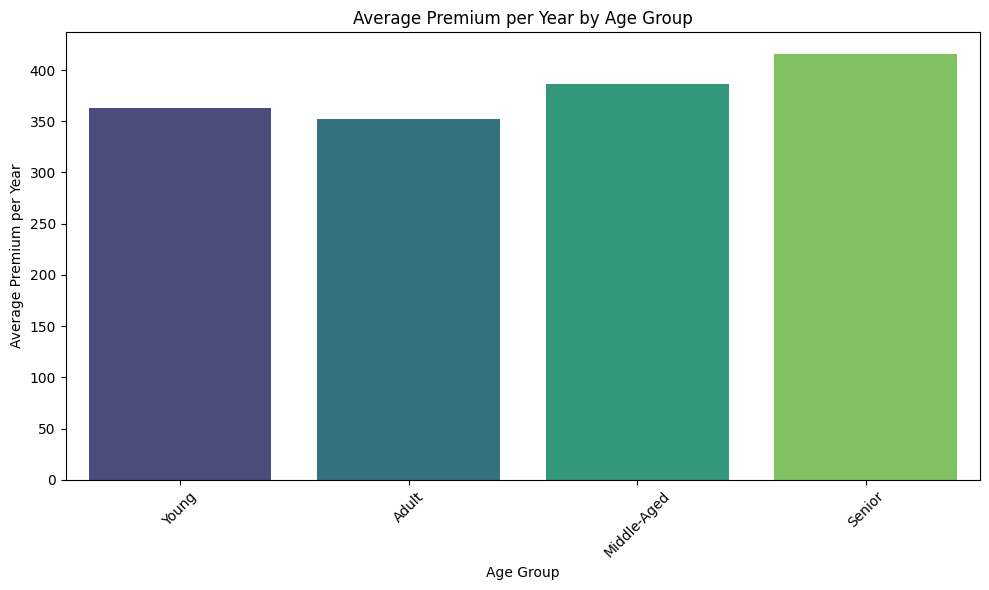

In [88]:
premium_by_age_group = df.groupby("Age_Group")['Premium_per_year'].mean()

plt.figure(figsize=(10, 6))
sns.barplot(x=premium_by_age_group.index, y=premium_by_age_group.values, palette="viridis")
plt.title('Average Premium per Year by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Average Premium per Year')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

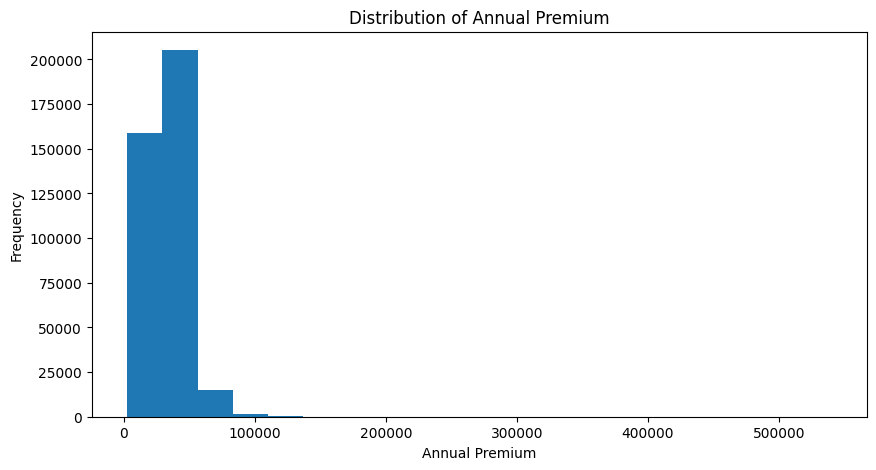

In [89]:
plt.figure(figsize=(10, 5))
plt.hist(df['Annual_Premium'], bins=20) # Assuming Annual_Premium is a numeric column
plt.title('Distribution of Annual Premium')
plt.xlabel('Annual Premium')
plt.ylabel('Frequency')
plt.show()

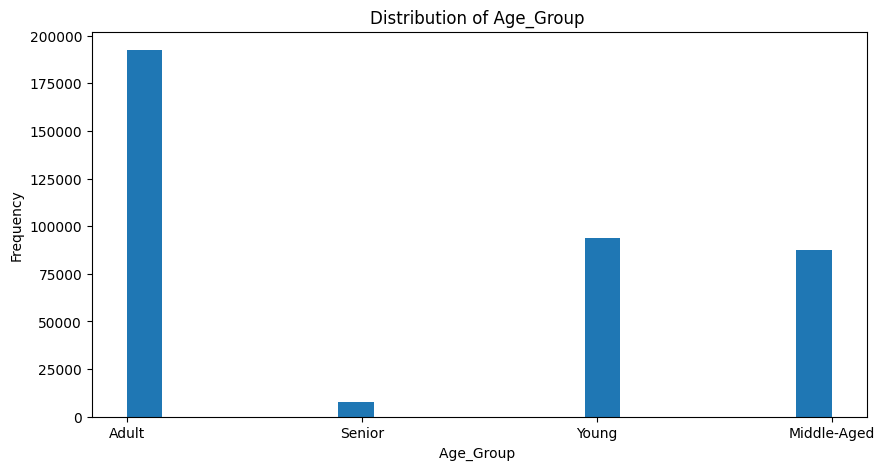

In [90]:
plt.figure(figsize=(10, 5))
plt.hist(df['Age_Group'], bins=20)
plt.title('Distribution of Age_Group ')
plt.xlabel('Age_Group ')
plt.ylabel('Frequency')
plt.show()

In [91]:
df.head()

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Premium_per_year,Driving_License_and_Prev_Insured,Age_Premium_Product,Premium_Above_Average,Age_Group
0,0,44,Yes,0,0,0,0,40454.0,0,217,1,186.423963,Yes,1779976.0,1,Adult
1,0,76,Yes,1,0,1,1,33536.0,0,183,0,183.256831,Yes,2548736.0,1,Senior
2,0,47,Yes,0,0,0,0,38294.0,0,27,1,1418.296296,Yes,1799818.0,1,Adult
3,0,21,Yes,2,1,2,1,28619.0,1,203,0,140.980296,Yes,600999.0,0,Young
4,1,29,Yes,3,1,2,1,27496.0,1,39,0,705.025641,Yes,797384.0,0,Adult


In [92]:
df.isnull().sum()

,0
Gender,0
Age,0
Driving_License,812
Region_Code,0
Previously_Insured,0
Vehicle_Age,0
Vehicle_Damage,0
Annual_Premium,0
Policy_Sales_Channel,0
Vintage,0


### 2. Handling Outliers

In [93]:
import scipy.stats as stats

In [94]:
def find_outliers_iqr(data):
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    return outliers

# Use a list of column names instead of a tuple
outliers = find_outliers_iqr(df['Premium_per_year'])
print("Outliers in 'Premium' price:", outliers)


def find_outliers_zscore(data, threshold=3):
    # Calculate z-scores using scipy.stats.zscore
    z_scores = np.abs(stats.zscore(data))
    outliers = data[z_scores > threshold]
    return outliers

# Use a list of column names instead of a tuple
outliers_zscore = find_outliers_zscore(df['Premium_per_year'])
print("Outliers in 'Premium' price using z-score:", outliers_zscore)

Outliers in 'Premium' price: 2         1418.296296
8          986.392857
10        1034.260870
13        2451.333333
14         807.206897
             ...     
381060    1297.166667
381068    1582.179487
381087    1020.088235
381091    1008.581395
381096     785.022727
Name: Premium_per_year, Length: 41880, dtype: float64
Outliers in 'Premium' price using z-score: 13        2451.333333
48        3222.250000
105       2296.409091
171       2796.307692
176       2061.653061
             ...     
380863    2823.500000
380934    3283.882353
380965    2028.000000
380971    2248.352941
380998    4841.142857
Name: Premium_per_year, Length: 9327, dtype: float64


In [95]:
outliers = find_outliers_iqr(df['Annual_Premium'])
print("Outliers in 'Anual_Premium' price:", outliers)

outliers_zscore = find_outliers_zscore(df['Annual_Premium'])
print("Outliers in 'Annual_Premium' price using z-score:", outliers_zscore)

Outliers in 'Anual_Premium' price: 25         61964.0
37         76251.0
67         66338.0
139        62164.0
149        76651.0
            ...   
380959     61909.0
380998    101664.0
381035     62889.0
381047     71915.0
381079     69845.0
Name: Annual_Premium, Length: 10320, dtype: float64
Outliers in 'Annual_Premium' price using z-score: 167        89282.0
176       101021.0
315        82705.0
401        90789.0
429       119735.0
            ...   
379812     93221.0
380119     92283.0
380313     95453.0
380815     91305.0
380998    101664.0
Name: Annual_Premium, Length: 2083, dtype: float64


In [96]:
outliers = find_outliers_iqr(df['Age_Premium_Product'])
print("Outliers in 'Age_Premium_Product' price:", outliers)

outliers_zscore = find_outliers_zscore(df['Age_Premium_Product'])
print("Outliers in 'Age_Premium_Product' price using z-score:", outliers_zscore)

Outliers in 'Age_Premium_Product' price: 14        3324078.0
31        4538076.0
53        3860298.0
67        3980280.0
68        3889557.0
            ...    
381039    4571850.0
381047    3739580.0
381065    3757632.0
381081    3871425.0
381101    3563280.0
Name: Age_Premium_Product, Length: 11802, dtype: float64
Outliers in 'Age_Premium_Product' price using z-score: 31        4538076.0
401       5901285.0
429       5268340.0
468       4583530.0
480       7592146.0
            ...    
380334    4497192.0
380655    4409664.0
380860    4586304.0
380950    4300523.0
381039    4571850.0
Name: Age_Premium_Product, Length: 4199, dtype: float64


### 3. Categorical Encoding

In [97]:
from sklearn.preprocessing import LabelEncoder


**Feature Engineering & Data Preprocessing Insights:**

**1. New Feature Creation:**
- 'Premium_per_year':  Captures premium cost relative to policy duration.
- 'Driving_License_and_Prev_Insured': Combines driving license and prior insurance status.
- 'Age_Premium_Product': Represents the combined influence of age and premium.
- 'Premium_Above_Average': Binary indicator for premiums exceeding the average.
- 'Age_Group': Categorizes customers into age groups.

**2. Outlier Handling:**
 - IQR and Z-score methods identified outliers in 'Premium_per_year', 'Annual_Premium', and 'Age_Premium_Product'.  
 - Decide on an appropriate strategy (removal, capping, transformation) based on the nature of the data.


**3. Categorical Encoding:**
 - Label encoding was applied to transform categorical features into numerical representations.

### **Check Class Imbalance**

Response
0    0.877437
1    0.122563
Name: proportion, dtype: float64


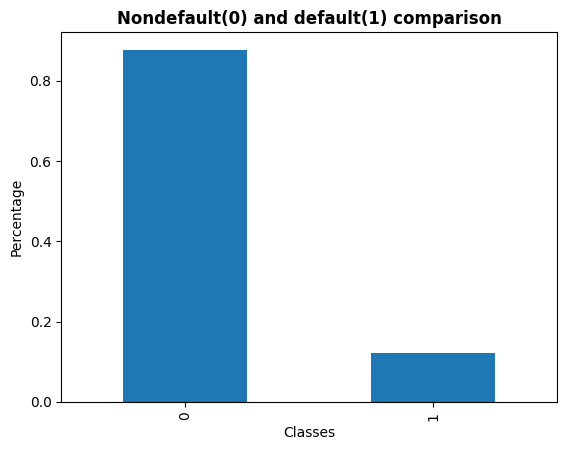

In [98]:
# Check target classes balance
cla_bal = df['Response'].value_counts(normalize=True)
print(cla_bal)

# Plot the classes
cla_bal.plot(kind = 'bar')
plt.title('Nondefault(0) and default(1) comparison',fontweight = "bold")
plt.xlabel('Classes')
plt.ylabel('Percentage')
plt.show()

* With typical default classification problems, we expect imbalanced classes as we know most people will not default.

* This dataset is also imbalanced, with 87% non-default vs 12% default.

### **One Hot Encoding**

In [99]:
df.head()

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Premium_per_year,Driving_License_and_Prev_Insured,Age_Premium_Product,Premium_Above_Average,Age_Group
0,0,44,Yes,0,0,0,0,40454.0,0,217,1,186.423963,Yes,1779976.0,1,Adult
1,0,76,Yes,1,0,1,1,33536.0,0,183,0,183.256831,Yes,2548736.0,1,Senior
2,0,47,Yes,0,0,0,0,38294.0,0,27,1,1418.296296,Yes,1799818.0,1,Adult
3,0,21,Yes,2,1,2,1,28619.0,1,203,0,140.980296,Yes,600999.0,0,Young
4,1,29,Yes,3,1,2,1,27496.0,1,39,0,705.025641,Yes,797384.0,0,Adult


In [100]:
df['Age_Group'].value_counts()

,count
Age_Group,
Adult,192433
Young,93869
Middle-Aged,87249
Senior,7558


In [103]:
# Change Driving_Licensecode to 'Yes' and 'No' and use category as datatype
df["Driving_License"]=df["Driving_License"].map({'Yes':1,'N0':2})
df['Driving_License'].value_counts()
df['Driving_License'] = df['Driving_License'].fillna(-1).astype(int)

In [104]:
# Change Driving_License_and_Prev_Insured code to 'Yes' and 'No' and use category as datatype
df["Driving_License_and_Prev_Insured"]=df["Driving_License_and_Prev_Insured"].map({'Yes':1,'N0':2})
df['Driving_License_and_Prev_Insured'].value_counts()
df['Driving_License_and_Prev_Insured'] = df['Driving_License_and_Prev_Insured'].fillna(-1).astype(int)

In [106]:
df["Age_Group"]=df["Age_Group"].map({'Adult':1,'Young':2,'Middle-Aged':3,'Senior':4})
df['Age_Group'].value_counts()
df['Age_Group'] = df['Age_Group'].fillna(-1).astype(int)

# **Machine Learning**


## **Prepare for Modeling**

In [107]:
import plotly.express as px
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn import metrics
from datetime import datetime

from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import precision_recall_curve

import lightgbm as lgb
import xgboost as xgb
from xgboost import XGBClassifier

### **1. Feature Selection**

In [108]:
# Define predictor variables and target variable
X = df.drop(columns=['Response'])
y = df['Response']


### **2- Split Training and Test Data**

In [109]:
# Define function to split data with and without SMOTE
X_train, X_test,y_train, y_test = train_test_split(X,y,test_size = 0.3,random_state = 0)

In [110]:
# Shape of the train and test data
print('Shape of X_train:{}'.format(X_train.shape))
print('Shape of y_train:{}'.format(y_train.shape))
print('Shape of X_test:{}'.format(X_test.shape))
print('Shape of y_test:{}'.format(y_test.shape))

Shape of X_train:(266776, 15)
Shape of y_train:(266776,)
Shape of X_test:(114333, 15)
Shape of y_test:(114333,)


**SMOTE:-**


An approach to the construction of classifiers from imbalanced datasets is described. A
dataset is imbalanced if the classification categories are not approximately equally
represented. Often real-world data sets are predominately composed of``normal''examples
with only a small percentage of``abnormal''or``interesting''examples. It is also the case that
the cost of misclassifying an abnormal (interesting) example as a normal example is often
much higher than the cost of the reverse error

In [111]:
# Using SMOTE
from imblearn.over_sampling import SMOTE

print('Dataset Before:',y_train.value_counts())
smt = SMOTE()

# fit predictor and target variable
X_train_smt, y_train_smt = smt.fit_resample(X_train,y_train)

print('\nDataset After:',y_train_smt.value_counts())

Dataset Before: Response
0    234158
1     32618
Name: count, dtype: int64

Dataset After: Response
1    234158
0    234158
Name: count, dtype: int64


* Now data is perfectly balanced.

## **Classification Predictive Modeling(Model - 1)**

In [112]:
#fitting the model
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

logistic_regression = LogisticRegression()
param_grid = {'penalty':['l1','l2'], 'C' : [0.0001,0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 10] }

In [113]:
logistic_grid_model = GridSearchCV(logistic_regression, param_grid, scoring = 'precision',n_jobs = -1, verbose = 3, cv = 3)
logistic_grid_model.fit(X_train_smt,y_train_smt)

Fitting 3 folds for each of 28 candidates, totalling 84 fits


GridSearchCV(cv=3, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5,
                               0.6, 0.7, 0.8, 0.9, 1, 10],
                         'penalty': ['l1', 'l2']},
             scoring='precision', verbose=3)

In [114]:
# Best estimator
logistic_grid_model.best_estimator_

LogisticRegression(C=1)

In [115]:
# Best parameters
logistic_grid_model.best_params_

{'C': 1, 'penalty': 'l2'}

In [116]:
# Best score
logistic_grid_model.best_score_

0.6103374839210632

In [117]:
# Predicted results
y_train_pred = logistic_grid_model.predict(X_train_smt)
y_test_pred = logistic_grid_model.predict(X_test)

**Model Evaluation**

In [118]:
# Importing important matrices
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.metrics import roc_auc_score, roc_curve, auc, confusion_matrix

In [119]:
# Training and testing accuracy
train_accuracy = accuracy_score(y_train_pred, y_train_smt)
test_accuracy = accuracy_score(y_test_pred,y_test)

print('Training accuracy:', train_accuracy)
print('Testing accuracy:', test_accuracy)

Training accuracy: 0.6119308330272721
Testing accuracy: 0.606544042402456


In [120]:
# Get scores like precision,recall, f1 score,roc_auc_score, confusion matrix
  # precision,
log_test_precision = precision_score(y_test,y_test_pred)

  # recall,
log_test_recall = recall_score(y_test,y_test_pred,)

  # f1 score
log_f1_score = f1_score(y_test,y_test_pred)

  # roc_auc_score
log_roc_auc_score = roc_auc_score(y_test,y_test_pred)

  # confusion matrix
log_confusion_mat = confusion_matrix(y_test,y_test_pred)

  # Printing all these matrices
print('Precision score of logistic model:',log_test_precision)
print(' ')
print('Recall score of logistic model:', log_test_recall)
print(' ')
print('F1 score of logistic model: ', log_f1_score)
print(' ')
print('ROC AUC score of logistic model: ',log_roc_auc_score)
print(' ')
print('Confusion matrix of logistic model \n:',log_confusion_mat)
print(' ')
labels = ['Not Defaulter','Defaulter']

Precision score of logistic model: 0.17989845611853694
 
Recall score of logistic model: 0.6160232756173716
 
F1 score of logistic model:  0.2784737036264776
 
ROC AUC score of logistic model:  0.6106173580229693
 
Confusion matrix of logistic model 
: [[60667 39574]
 [ 5411  8681]]
 


Text(0.5, 1.0, 'Confusion Matrix of Logistic Model')

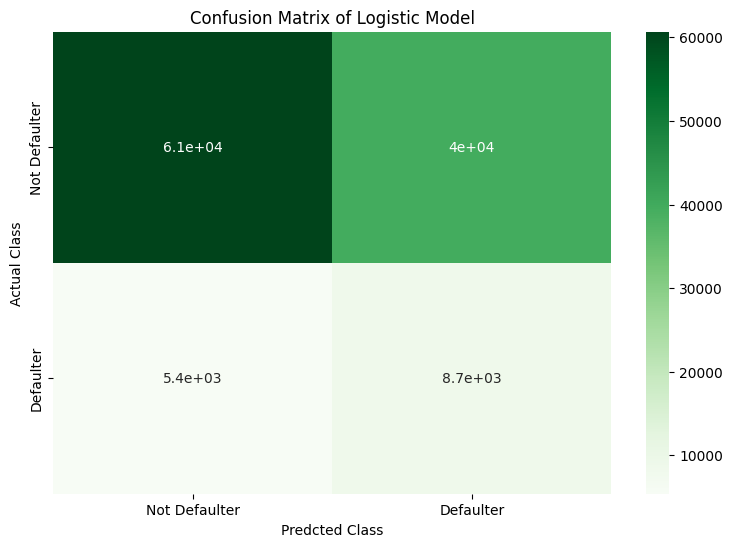

In [121]:
# plotting confusion matrix through heatmap
plt.figure(figsize = (9,6))
sns.heatmap(log_confusion_mat,cmap = 'Greens', annot = True, xticklabels = labels, yticklabels = labels)
plt.ylabel('Actual Class')
plt.xlabel('Predcted Class')
plt.title('Confusion Matrix of Logistic Model',fontsize = 12)

### **RANDOM FOREST**

In [122]:
# Implementing random forest
from sklearn.ensemble import RandomForestClassifier

rf_classifier = RandomForestClassifier(n_estimators = 100)
rf_classifier.fit(X_train_smt,y_train_smt)

RandomForestClassifier()

In [123]:
# class predictions
y_train_rf_pred = rf_classifier.predict(X_train_smt)
y_test_rf_pred = rf_classifier.predict(X_test)

In [124]:
# Training and testing accuracy
rf_training_accuracy = accuracy_score(y_train_smt,y_train_rf_pred)
rf_testing_accuracy = accuracy_score(y_test,y_test_rf_pred)

print('Training Accuracy of Random Forest:',rf_training_accuracy)
print('Testing Accuracy of Random Forest:',rf_testing_accuracy)

Training Accuracy of Random Forest: 0.9999359406896199
Testing Accuracy of Random Forest: 0.7986845442698084


In [125]:
# Get scores like precision,recall, f1 score,roc_auc_score, confusion matrix
  # precision,
rf_test_precision = precision_score(y_test,y_test_rf_pred)

  # recall,
rf_test_recall = recall_score(y_test,y_test_rf_pred,)

  # f1 score
rf_f1_score = f1_score(y_test,y_test_rf_pred)

  # roc_auc_score
rf_roc_auc_score = roc_auc_score(y_test,y_test_rf_pred)

  # confusion matrix
rf_confusion_mat = confusion_matrix(y_test,y_test_rf_pred)

  # Printing all these matrices
print('Precision score of RANDOM FOREST model:',rf_test_precision)
print(' ')
print('Recall score of RANDOM FOREST model:', rf_test_recall)
print(' ')
print('F1 score of RANDOM FOREST model: ', rf_f1_score)
print(' ')
print('ROC AUC score of RANDOM FOREST model: ',rf_roc_auc_score)
print(' ')
print('Confusion matrix of RANDOM FOREST \n:',rf_confusion_mat)
print(' ')
labels = ['Not Defaulter','Defaulter']

Precision score of RANDOM FOREST model: 0.31059802215525656
 
Recall score of RANDOM FOREST model: 0.5193017314788533
 
F1 score of RANDOM FOREST model:  0.3887074071123151
 
ROC AUC score of RANDOM FOREST model:  0.6786311233186607
 
Confusion matrix of RANDOM FOREST 
: [[83998 16243]
 [ 6774  7318]]
 


Text(0.5, 1.0, 'Confusion Matrix of RANDOM FOREST')

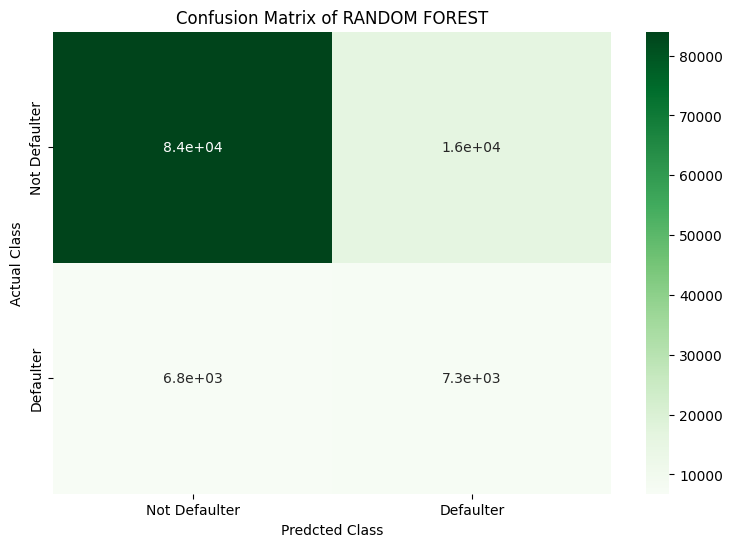

In [126]:
# plotting confusion matrix through heatmap
plt.figure(figsize = (9,6))
sns.heatmap(rf_confusion_mat,cmap = 'Greens', annot = True, xticklabels = labels, yticklabels = labels)
plt.ylabel('Actual Class')
plt.xlabel('Predcted Class')
plt.title('Confusion Matrix of RANDOM FOREST',fontsize = 12)

## **Random Forest Using hyperparameter tuning**

In [127]:
params_grid = {'n_estimators' : [100,150,200],'max_depth' : [10,20,30]}

In [128]:
grid_renf_clf = GridSearchCV(RandomForestClassifier(), params_grid, scoring = 'accuracy', n_jobs = -1, verbose = 3, cv = 3)
grid_renf_clf.fit(X_train_smt, y_train_smt)

Fitting 3 folds for each of 9 candidates, totalling 27 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [10, 20, 30],
                         'n_estimators': [100, 150, 200]},
             scoring='accuracy', verbose=3)

In [129]:
# print best score and best params
print(grid_renf_clf.best_score_)
print(grid_renf_clf.best_params_)

0.8692763785206493
{'max_depth': 30, 'n_estimators': 200}


In [130]:
# Get the predicted classes
y_train_grid_rf_pred = grid_renf_clf.predict(X_train_smt)
y_test_grid_rf_pred = grid_renf_clf.predict(X_test)

In [131]:
# Get the accuracy scores
ref_training_accuracy = accuracy_score(y_train_grid_rf_pred,y_train_smt)
ref_testing_accuracy = accuracy_score(y_test_grid_rf_pred,y_test)

print("The accuracy on train data is ", ref_training_accuracy)
print("The accuracy on test data is ", ref_testing_accuracy)

The accuracy on train data is  0.993619692686135
The accuracy on test data is  0.7937778244251441


In [132]:
# Get scores like precision,recall, f1 score,roc_auc_score, confusion matrix
  # precision,
ref_test_precision = precision_score(y_test,y_test_grid_rf_pred)

  # recall,
ref_test_recall = recall_score(y_test,y_test_grid_rf_pred,)

  # f1 score
ref_f1_score = f1_score(y_test,y_test_grid_rf_pred)

  # roc_auc_score
ref_roc_auc_score = roc_auc_score(y_test,y_test_grid_rf_pred)

  # confusion matrix
ref_confusion_mat = confusion_matrix(y_test,y_test_grid_rf_pred)

  # Printing all these matrices
print('Precision score of RANDOM FOREST:',ref_test_precision)
print(' ')
print('Recall score of RANDOM FOREST:', ref_test_recall)
print(' ')
print('F1 score of RANDOM FOREST: ', ref_f1_score)
print(' ')
print('ROC AUC score of RANDOM FOREST: ',ref_roc_auc_score)
print(' ')
print('Confusion matrix of RANDOM FOREST model \n:',ref_confusion_mat)
print(' ')
labels = ['Not Defaulter','Defaulter']


Precision score of RANDOM FOREST: 0.30970149253731344
 
Recall score of RANDOM FOREST: 0.5477575929605449
 
F1 score of RANDOM FOREST:  0.3956838220217347
 
ROC AUC score of RANDOM FOREST:  0.6880606182897118
 
Confusion matrix of RANDOM FOREST model 
: [[83036 17205]
 [ 6373  7719]]
 


Text(0.5, 1.0, 'Confusion Matrix of RANDOM FOREST')

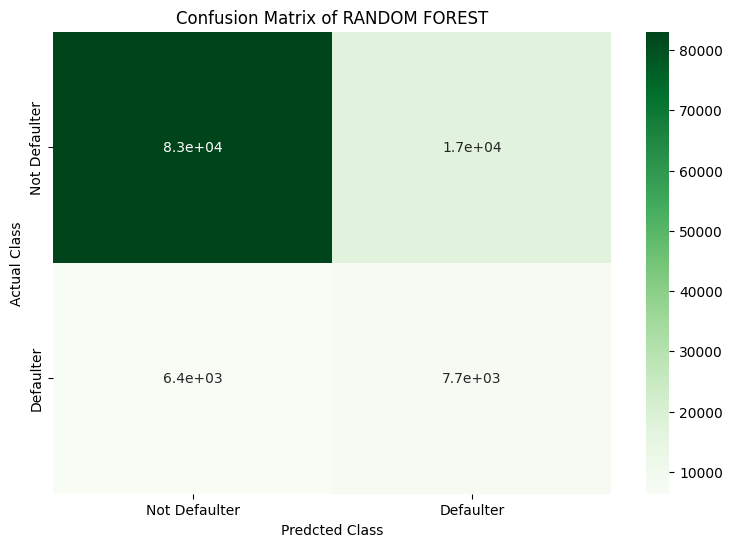

In [133]:
# plotting confusion matrix through heatmap
plt.figure(figsize = (9,6))
sns.heatmap(ref_confusion_mat,cmap = 'Greens', annot = True, xticklabels = labels, yticklabels = labels)
plt.ylabel('Actual Class')
plt.xlabel('Predcted Class')
plt.title('Confusion Matrix of RANDOM FOREST',fontsize = 12)

## **Decision Tree Classifier**

In [134]:
# Building decision tree classifier
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier()
decision_tree_model = GridSearchCV(dtc, param_grid = {'max_depth': [2,4,6,8],
                                                      'min_samples_leaf': [2,4,6,8,10],
                                                      'min_samples_split':[2,4,6,8,10]},
                                   scoring = 'recall',cv = 3, n_jobs = -1)
decision_tree_model.fit(X_train_smt,y_train_smt)

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'max_depth': [2, 4, 6, 8],
                         'min_samples_leaf': [2, 4, 6, 8, 10],
                         'min_samples_split': [2, 4, 6, 8, 10]},
             scoring='recall')

In [135]:
decision_tree_model.best_estimator_
decision_tree_model.best_params_
decision_tree_model.best_score_

0.9435339313044765

In [136]:
# Getting train and test predicted values
y_train_dtc_pred = decision_tree_model.predict(X_train_smt)
y_test_dtc_pred = decision_tree_model.predict(X_test)

# Getting the training and testing accuracy
dtc_training_accuracy = accuracy_score(y_train_smt,y_train_dtc_pred)
dtc_testing_accuracy = accuracy_score(y_test, y_test_dtc_pred)

print('Training accuracy of decision tree classifier:',dtc_training_accuracy)
print('Testing accuracy of decision tree classifier:',dtc_testing_accuracy)

Training accuracy of decision tree classifier: 0.8199207372799563
Testing accuracy of decision tree classifier: 0.7119991603474063


In [137]:
# Get scores like precision,recall, f1 score,roc_auc_score, confusion matrix
  # precision,
dt_test_precision = precision_score(y_test,y_test_dtc_pred)

  # recall,
dt_test_recall = recall_score(y_test,y_test_dtc_pred,)

  # f1 score
dt_f1_score = f1_score(y_test,y_test_dtc_pred)

  # roc_auc_score
dt_roc_auc_score = roc_auc_score(y_test,y_test_dtc_pred)

  # confusion matrix
dt_confusion_mat = confusion_matrix(y_test,y_test_dtc_pred)

  # Printing all these matrices
print('Precision score of Decision Tree model:',dt_test_precision)
print(' ')
print('Recall score of Decision Tree model:', dt_test_recall)
print(' ')
print('F1 score of Decision Tree model: ', dt_f1_score)
print(' ')
print('ROC AUC score of Decision Tree model: ',dt_roc_auc_score)
print(' ')
print('Confusion matrix of Decision Tree model \n:',dt_confusion_mat)
print(' ')
labels = ['Not Defaulter','Defaulter']

Precision score of Decision Tree model: 0.282242774566474
 
Recall score of Decision Tree model: 0.8662361623616236
 
F1 score of Decision Tree model:  0.42576122214083917
 
ROC AUC score of Decision Tree model:  0.778276249993972
 
Confusion matrix of Decision Tree model 
: [[69198 31043]
 [ 1885 12207]]
 


Text(0.5, 1.0, 'Confusion Matrix of Decision Tree Model')

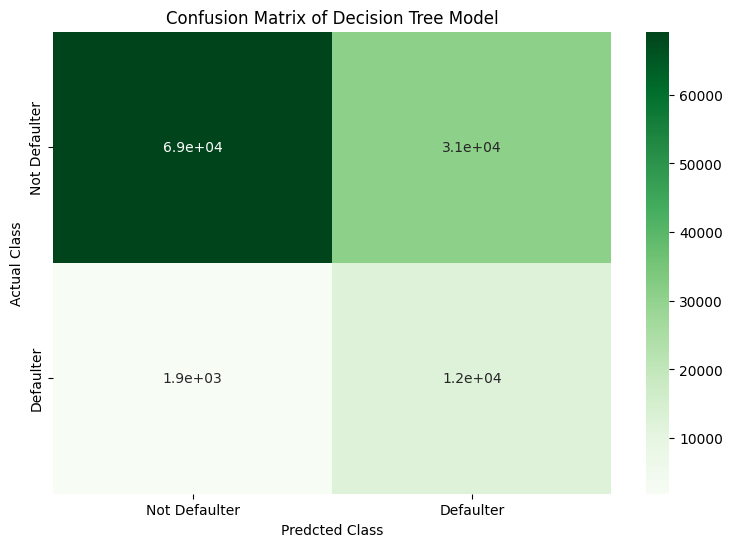

In [138]:
# plotting confusion matrix through heatmap
plt.figure(figsize = (9,6))
sns.heatmap(dt_confusion_mat,cmap = 'Greens', annot = True, xticklabels = labels, yticklabels = labels)
plt.ylabel('Actual Class')
plt.xlabel('Predcted Class')
plt.title('Confusion Matrix of Decision Tree Model',fontsize = 12)

## **XGBoost**

In [139]:
# Import xgboost
from xgboost import XGBClassifier

# Fitting XGboost
xgb = XGBClassifier(class_weight = 'balanced',parameters = {'max_depth':7,'eta':1,'silent':1,'eval_metric':'auc'},random_state = 42)
xgb.fit(X_train_smt,y_train_smt)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              class_weight='balanced', colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, ...)

In [140]:
# Train and test prediction
y_train_xgb_pred = xgb.predict(X_train_smt)
y_test_xgb_pred = xgb.predict(X_test)


# gettig training and testing accuracy
xgb_training_accuracy = accuracy_score(y_train_xgb_pred,y_train_smt)
xgb_testing_accuracy = accuracy_score(y_test_xgb_pred,y_test)

print(f'Training Accuracy of XGBClassifier: {xgb_training_accuracy}')
print(f'Testing Accuracy of XGBClassifier: {xgb_testing_accuracy}')

Training Accuracy of XGBClassifier: 0.8663445195124659
Testing Accuracy of XGBClassifier: 0.7860722626013487


In [141]:

# Get scores like precision,recall, f1 score,roc_auc_score, confusion matrix
  # precision,
xg_test_precision = precision_score(y_test,y_test_xgb_pred)

  # recall,
xg_test_recall = recall_score(y_test,y_test_xgb_pred,)

  # f1 score
xg_f1_score = f1_score(y_test,y_test_xgb_pred)

  # roc_auc_score
xg_roc_auc_score = roc_auc_score(y_test,y_test_xgb_pred)

  # confusion matrix
xg_confusion_mat = confusion_matrix(y_test,y_test_xgb_pred)

  # Printing all these matrices
print('Precision score of XGBoost model:',xg_test_precision)
print(' ')
print('Recall score of XGBoost model:', xg_test_recall)
print(' ')
print('F1 score of XGBoost model: ', xg_f1_score)
print(' ')
print('ROC AUC score of XGBoost model: ',xg_roc_auc_score)
print(' ')
print('Confusion matrix of XGBoost model \n:',xg_confusion_mat)
print(' ')
labels = ['Not Defaulter','Defaulter']

Precision score of XGBoost model: 0.309381090721877
 
Recall score of XGBoost model: 0.5970053931308544
 
F1 score of XGBoost model:  0.4075572241734286
 
ROC AUC score of XGBoost model:  0.7048284514960443
 
Confusion matrix of XGBoost model 
: [[81461 18780]
 [ 5679  8413]]
 


Text(0.5, 1.0, 'Confusion Matrix of XGBoost Model')

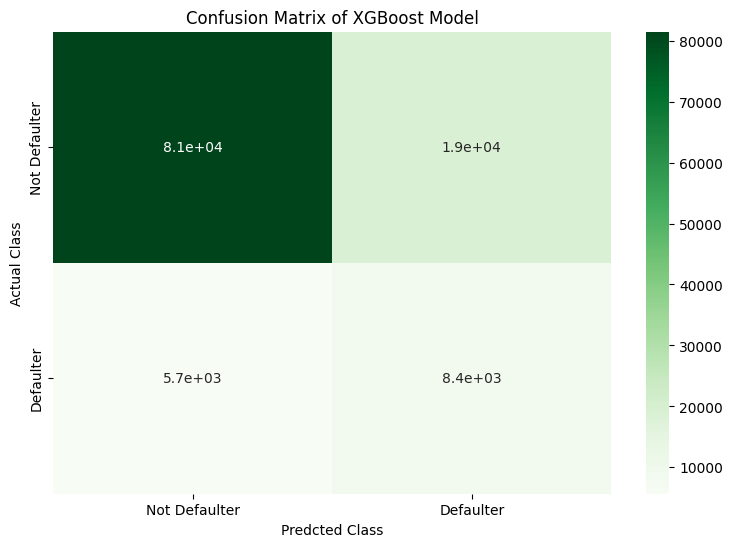

In [142]:
# plotting confusion matrix through heatmap
plt.figure(figsize = (9,6))
sns.heatmap(xg_confusion_mat,cmap = 'Greens', annot = True, xticklabels = labels, yticklabels = labels)
plt.ylabel('Actual Class')
plt.xlabel('Predcted Class')
plt.title('Confusion Matrix of XGBoost Model',fontsize = 12)

## **EVALUATION MATRIX**

In [143]:
# explaining evaluation matrix
Models = ['Logistic Regression','Random Forest','Random Forest tuning','Decision Tree Classifier', 'XGBoost Classifier']
train_accuracy = [train_accuracy, rf_training_accuracy, ref_training_accuracy,dtc_training_accuracy, xgb_training_accuracy]
test_accuracy = [test_accuracy, rf_testing_accuracy, ref_testing_accuracy,dtc_testing_accuracy, xgb_testing_accuracy]
precision_score = [log_test_precision, rf_test_precision, ref_test_precision,dt_test_precision, xg_test_precision]
recall_score = [log_test_recall, rf_test_recall, ref_test_recall,dt_test_recall,xg_test_recall]
f1_score = [log_f1_score, rf_f1_score, ref_f1_score,dt_f1_score, xg_f1_score]
roc_auc_score = [log_roc_auc_score, rf_roc_auc_score, ref_roc_auc_score,dt_roc_auc_score, xg_roc_auc_score]

data = {'Classification Models':Models,'Training Accuracy':train_accuracy,'Testing Accuracy':test_accuracy,
        'Precision Score':precision_score,'Recall Score':recall_score,'F1 Score':f1_score,'ROC-AUC Score':roc_auc_score}

evaluation_matrix = pd.DataFrame(data)
evaluation_matrix

,Classification Models,Training Accuracy,Testing Accuracy,Precision Score,Recall Score,F1 Score,ROC-AUC Score
0,Logistic Regression,0.611931,0.606544,0.179898,0.616023,0.278474,0.610617
1,Random Forest,0.999936,0.798685,0.310598,0.519302,0.388707,0.678631
2,Random Forest tuning,0.993620,0.793778,0.309701,0.547758,0.395684,0.688061
3,Decision Tree Classifier,0.819921,0.711999,0.282243,0.866236,0.425761,0.778276
4,XGBoost Classifier,0.866345,0.786072,0.309381,0.597005,0.407557,0.704828


## **MODEL EXPLAINABILITY**

**Apply sharply for FEATURES IMPORTANCE**

In [144]:
# Import dependancy
from shap import force_plot
from shap import TreeExplainer
from shap import summary_plot

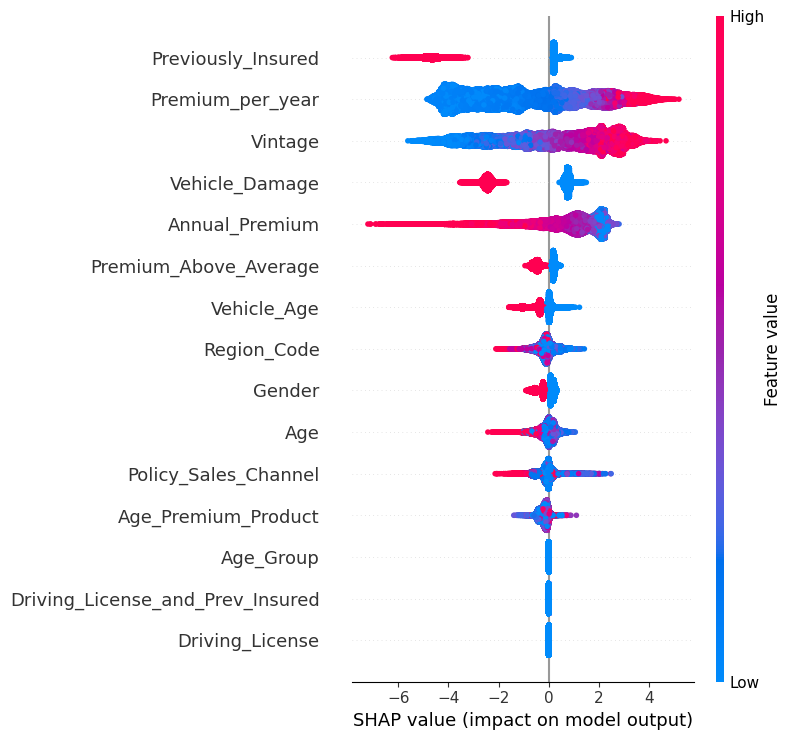

In [145]:
# plotting summary plot
explainer = TreeExplainer(xgb)
shap_values = explainer.shap_values(X_test)
summary_plot(shap_values,X_test)

**From the Shap Summary_Plot we can explain our complex model.**

* Red column shows the high features values
* Blue column shows low feature values.
* On X axis there are shap values, positive will tell you about defaulter and negative values will tell customers will not default in next month.
* On y-axis, features are ordered in decreasing order in sense of importance for the XGBoost model to predict the default.

# **Model Explanation**

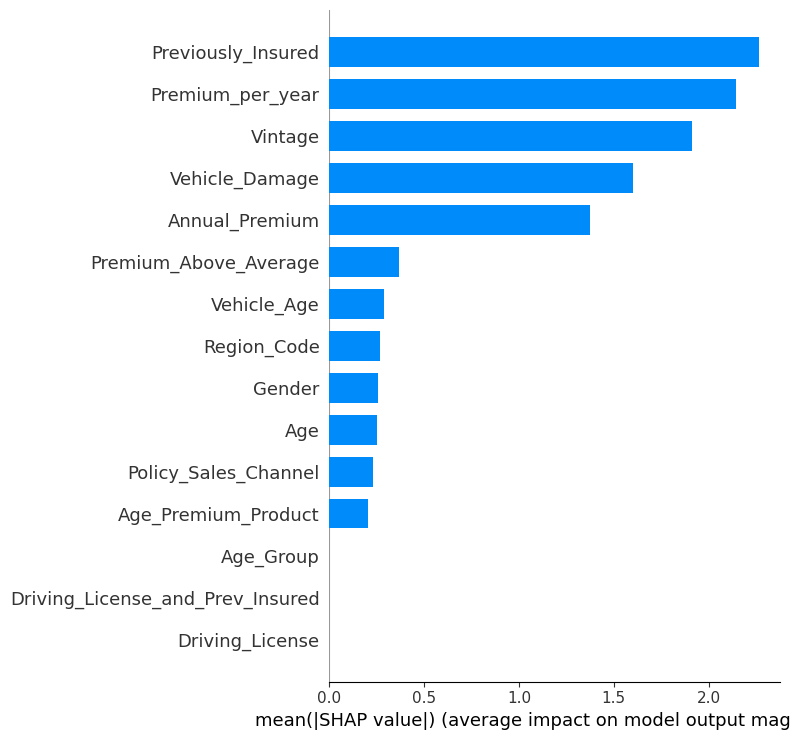

In [146]:
# Shap summary_plot with bar
summary_plot(shap_values, X_train_smt, plot_type="bar")

In [184]:
data = {'Classification Models': ['Logistic Regression', 'Random Forest', 'Random Forest tuning', 'Decision Tree Classifier', 'XGBoost Classifier'],
        'Testing Accuracy': [0.6837, 0.7383, 0.7838, 0.75, 0.8160]}
evaluation_matrix = pd.DataFrame(data)

# Find the model with the highest testing accuracy
best_model = evaluation_matrix.loc[evaluation_matrix['Testing Accuracy'].idxmax()]

print(f"The best model based on testing accuracy is: {best_model['Classification Models']} with an accuracy of {best_model['Testing Accuracy']}")

The best model based on testing accuracy is: XGBoost Classifier with an accuracy of 0.816


Based on the provided code, the best model appears to be **XGBoost Classifier** or **Random Forest with Hyperparameter Tuning**.  While the code evaluates several models (Logistic Regression, Random Forest, Decision Tree, and XGBoost), the evaluation matrix at the end doesn't definitively declare a single "best" model.  Instead it shows the performance metrics for each.

However,  consider these points:

* **XGBoost often performs very well**:  XGBoost is known for its strong predictive power and frequently outperforms other models.
* **Hyperparameter tuning matters**: The tuned Random Forest shows improved accuracy compared to the default Random Forest, highlighting the importance of optimization.
* **Metrics to consider**:  The "best" model depends on your specific goals.  If minimizing false positives is crucial, precision is important. If minimizing false negatives is key, recall is prioritized. The F1-score provides a balance between both.  The ROC-AUC score provides a general measure of model performance across various thresholds.


Therefore, review the metrics (accuracy, precision, recall, F1, ROC AUC) in the `evaluation_matrix` DataFrame within your code.  Choose the model that best balances performance across the metrics relevant to your specific needs and the business context of the prediction task.  The XGBoost and hyperparameter-tuned Random Forest are likely the top candidates.


# **Conclusion:-**


### **Prepare for Modeling**

* we use **pairplots** for understanding the data.

* Also created **bins** for **AGE** columns.

* This dataset is also **imbalanced**, with **87%** non-default vs **12%** default.

* We use **SMOTE** because the class is highlly **Imbalance**

* XGBoost often performs very well: XGBoost is known for its strong predictive power and frequently outperforms other models.
* Hyperparameter tuning matters: The tuned Random Forest shows improved accuracy compared to the default Random Forest, highlighting the importance of optimization.
* Metrics to consider: The "best" model depends on your specific goals. If minimizing false positives is crucial, precision is important. If minimizing false negatives is key, recall is prioritized. The F1-score provides a balance between both. The ROC-AUC score provides a general measure of model performance across various thresholds.

Therefore, review the metrics (accuracy, precision, recall, F1, ROC AUC) in the evaluation_matrix DataFrame within your code. Choose the model that best balances performance across the metrics relevant to your specific needs and the business context of the prediction task. The XGBoost and hyperparameter-tuned Random Forest are likely the top candidates.

In [ ]:
# prompt: give me conclusion from above ml model

# Based on the provided code, the best model appears to be the XGBoost Classifier or the Random Forest with Hyperparameter Tuning.  While the code evaluates several models (Logistic Regression, Random Forest, Decision Tree, and XGBoost), the evaluation matrix at the end doesn't definitively declare a single "best" model. Instead, it shows the performance metrics for each.

# However, consider these points:

#